# PyTorch - using pretrained CNN Models

We can load pre-definied or even pretrained models with a wide range of architectures.

* VGG
* ResNet
* 

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms

import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import cv2
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm

# check if cuda is usable
if torch.cuda.is_available():
  device = 'cuda' 
else:
  device = 'cpu' 

print(f"Using device: {device}")

Using device: cuda


In [2]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from lib.report import show_torch_image

In [3]:
!mkdir -p ./out/cnn_visualization

## PyTorch Models
We can load a large number of (pretrained) models directly from torchvision.models.
To see all the available models, we can use the `list_models` function.

In [4]:
from torchvision.models import list_models

all_models = list_models()
classification_models = list_models(module=torchvision.models)

print(f'All models (n={len(all_models)}): \r\n{all_models}')
print(f'\r\n\r\nClassification models (n={len(classification_models)}): \r\n{classification_models}')

All models (n=121): 
['alexnet', 'convnext_base', 'convnext_large', 'convnext_small', 'convnext_tiny', 'deeplabv3_mobilenet_v3_large', 'deeplabv3_resnet101', 'deeplabv3_resnet50', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b2', 'efficientnet_b3', 'efficientnet_b4', 'efficientnet_b5', 'efficientnet_b6', 'efficientnet_b7', 'efficientnet_v2_l', 'efficientnet_v2_m', 'efficientnet_v2_s', 'fasterrcnn_mobilenet_v3_large_320_fpn', 'fasterrcnn_mobilenet_v3_large_fpn', 'fasterrcnn_resnet50_fpn', 'fasterrcnn_resnet50_fpn_v2', 'fcn_resnet101', 'fcn_resnet50', 'fcos_resnet50_fpn', 'googlenet', 'inception_v3', 'keypointrcnn_resnet50_fpn', 'lraspp_mobilenet_v3_large', 'maskrcnn_resnet50_fpn', 'maskrcnn_resnet50_fpn_v2', 'maxvit_t', 'mc3_18', 'mnasnet0_5', 'mnasnet0_75', 'mnasnet1_0', 'mnasnet1_3', 'mobilenet_v2', 'mobilenet_v3_large', 'mobilenet_v3_small', 'mvit_v1_b', 'mvit_v2_s', 'quantized_googlenet', 'quantized_inception_v3', 'q

## VGG16

In [5]:
model = torchvision.models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1')
if torch.cuda.is_available():
    model.cuda()

We can use torchsummary to show a keras-like summary of our model:

In [7]:
!pip install torchsummary
from torchsummary import summary 
summary(model, input_size = (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

## Make some predictions

In [8]:
from torchvision.io import read_image

# create a small helper function to reduce code duplication across this notebook
def predict_img_samples(model, weights, input_img):
    name = model.__class__.__name__
    if model.name != None:
        name = model.name
    print(f"---------- Predicting some samples for '{name}' ----------\r\n")
    
    model.eval()

    # Initialize the inference transforms
    preprocess = weights.transforms()

    classes = weights.meta["categories"]

    for image, expected_class in input_images:

        img = read_image(image)

        # Apply inference preprocessing transforms
        batch = preprocess(img).unsqueeze(0).to(device)

        prediction = model(batch).squeeze(0).softmax(0)
        class_id = prediction.argmax().item()
        score = prediction[class_id].item()
        category_name = classes[class_id]
        actual_category_name = classes[expected_class]
        print(f"Predicted: {category_name}: {100 * score:.1f}%, Actual: {actual_category_name}")
        plt.imshow(torchvision.transforms.functional.to_pil_image(img))
        plt.show()

---------- Predicting some samples for 'VGG16 (IMAGENET1K_V1)' ----------

Predicted: tiger: 72.4%, Actual: tiger


/home/user/mambaforge/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


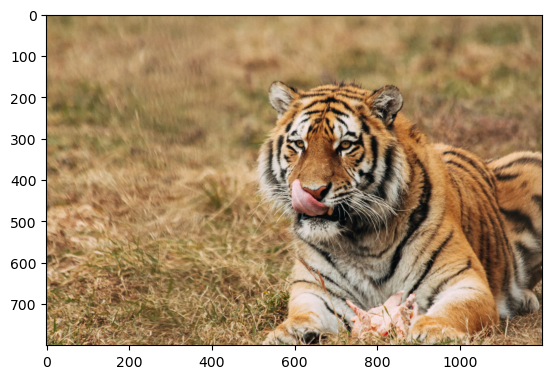

Predicted: Persian cat: 65.3%, Actual: tabby


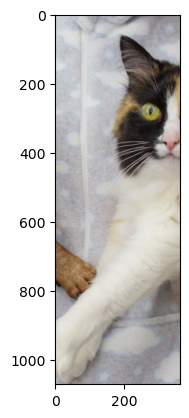

Predicted: boxer: 98.3%, Actual: boxer


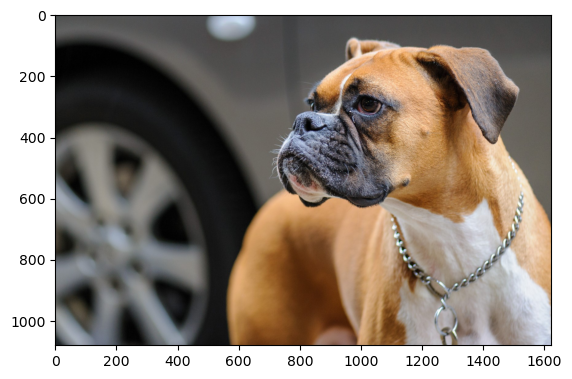

Predicted: Staffordshire bullterrier: 60.4%, Actual: Staffordshire bullterrier


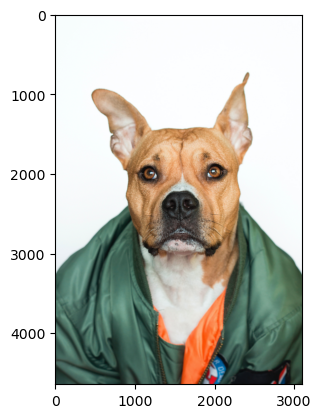

Predicted: screw: 55.2%, Actual: nail


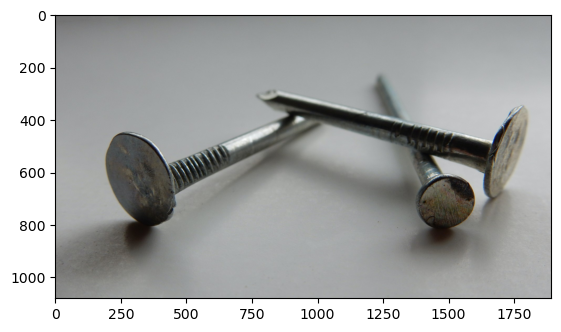

Predicted: tile roof: 100.0%, Actual: tile roof


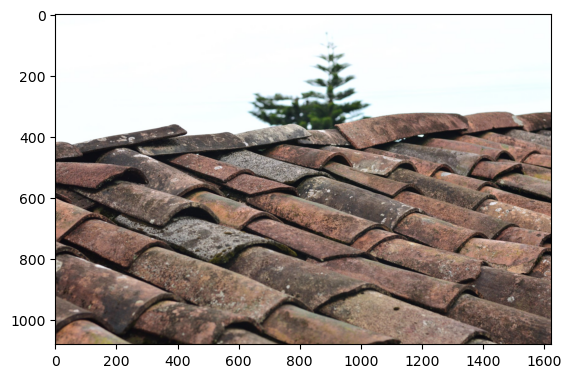

Predicted: forklift: 98.9%, Actual: forklift


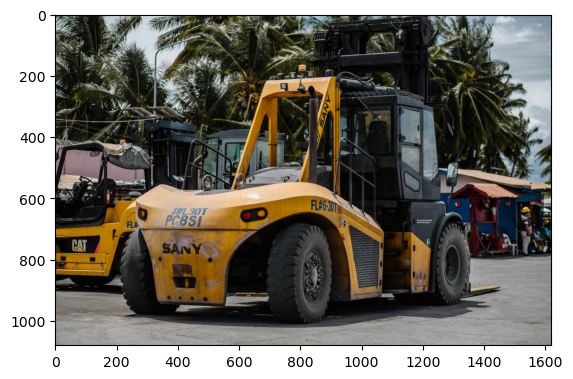

In [9]:
from torchvision.models import vgg16, VGG16_Weights

# Initialize model with the best available weights
weights = VGG16_Weights.IMAGENET1K_V1
model = vgg16(weights=weights)
model.name = 'VGG16 (IMAGENET1K_V1)'
if torch.cuda.is_available():
    model.cuda()

input_images = [
                    ("../images/tiger.jpg", 292),
                    ("../images/cat_cropped.jpg", 281),
                    ("../images/boxer.jpg", 242),
                    ("../images/staffordshire.jpg", 179),
                    ("../images/nails.jpg", 677),
                    ("../images/roof.jpg", 858),
                    ("../images/forklift.jpg", 561)
               ]
predict_img_samples(model, weights, input_images)

## ResNet

In [10]:
from torchvision.models import resnet152, ResNet152_Weights

# Initialize model with the best available weights
weights = ResNet152_Weights.DEFAULT
model = resnet152(weights=weights)
model.name = 'ResNet152 (DEFAULT)'

if torch.cuda.is_available():
    model.cuda()

summary(model, input_size = (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,408
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
         MaxPool2d-4         [-1, 64, 128, 128]               0
            Conv2d-5         [-1, 64, 128, 128]           4,096
       BatchNorm2d-6         [-1, 64, 128, 128]             128
              ReLU-7         [-1, 64, 128, 128]               0
            Conv2d-8         [-1, 64, 128, 128]          36,864
       BatchNorm2d-9         [-1, 64, 128, 128]             128
             ReLU-10         [-1, 64, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]          16,384
      BatchNorm2d-12        [-1, 256, 128, 128]             512
           Conv2d-13        [-1, 256, 128, 128]          16,384
      BatchNorm2d-14        [-1, 256, 1

---------- Predicting some samples for 'ResNet152 (DEFAULT)' ----------

Predicted: tiger: 52.1%, Actual: tiger


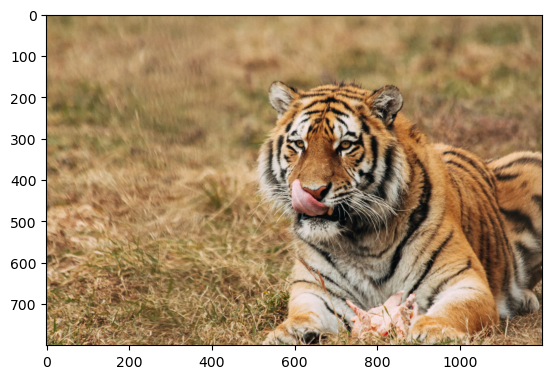

Predicted: Egyptian cat: 11.0%, Actual: tabby


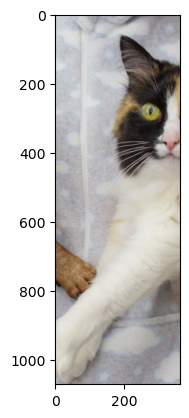

Predicted: boxer: 79.3%, Actual: boxer


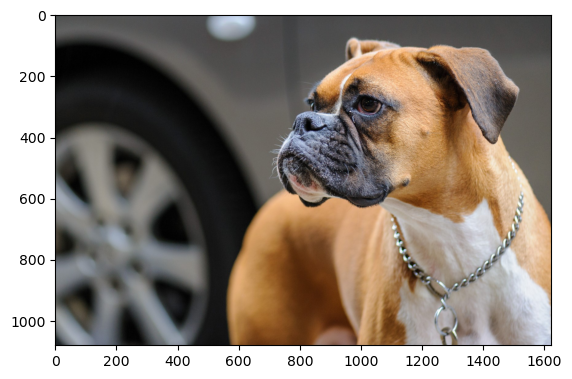

Predicted: Staffordshire bullterrier: 16.4%, Actual: Staffordshire bullterrier


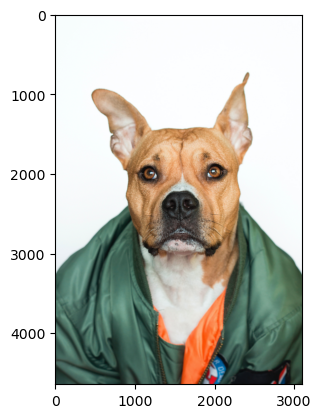

Predicted: screw: 52.1%, Actual: nail


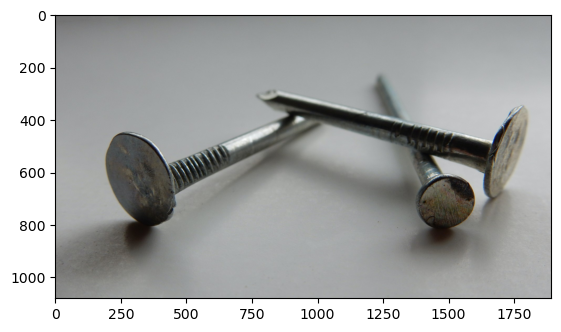

Predicted: tile roof: 81.0%, Actual: tile roof


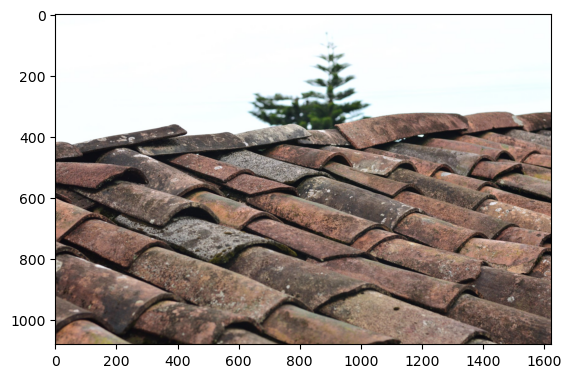

Predicted: forklift: 78.4%, Actual: forklift


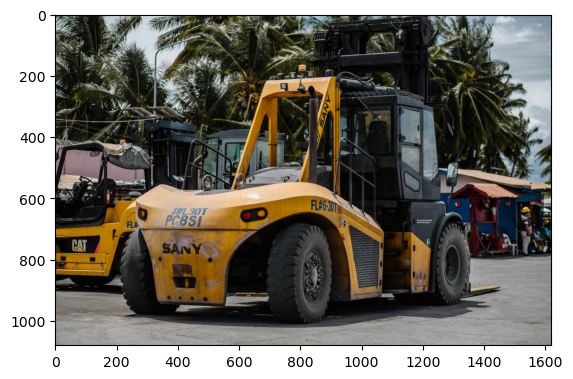

In [11]:
predict_img_samples(model, weights, input_images)

## Inception

In [12]:
from torchvision.models import inception_v3, Inception_V3_Weights

# Initialize model with the best available weights
weights = Inception_V3_Weights.IMAGENET1K_V1
model = inception_v3(weights=weights)
model.name = 'Inception V3 (IMAGENET1K_V1)'
if torch.cuda.is_available():
    model.cuda()

summary(model, input_size = (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 255, 255]             864
       BatchNorm2d-2         [-1, 32, 255, 255]              64
       BasicConv2d-3         [-1, 32, 255, 255]               0
            Conv2d-4         [-1, 32, 253, 253]           9,216
       BatchNorm2d-5         [-1, 32, 253, 253]              64
       BasicConv2d-6         [-1, 32, 253, 253]               0
            Conv2d-7         [-1, 64, 253, 253]          18,432
       BatchNorm2d-8         [-1, 64, 253, 253]             128
       BasicConv2d-9         [-1, 64, 253, 253]               0
        MaxPool2d-10         [-1, 64, 126, 126]               0
           Conv2d-11         [-1, 80, 126, 126]           5,120
      BatchNorm2d-12         [-1, 80, 126, 126]             160
      BasicConv2d-13         [-1, 80, 126, 126]               0
           Conv2d-14        [-1, 192, 1

---------- Predicting some samples for 'Inception V3 (IMAGENET1K_V1)' ----------

Predicted: tiger: 73.4%, Actual: tiger


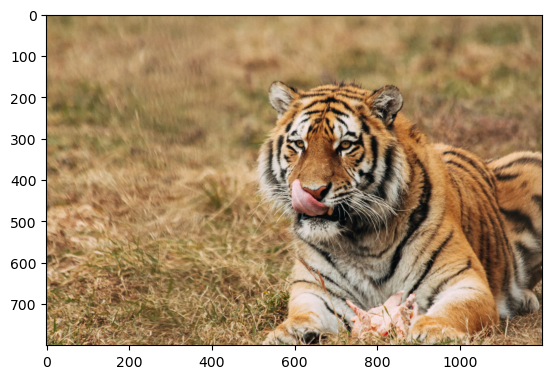

Predicted: Persian cat: 36.2%, Actual: tabby


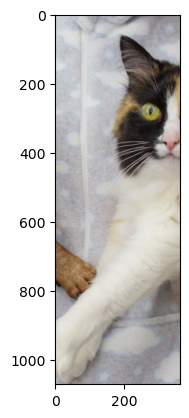

Predicted: boxer: 87.7%, Actual: boxer


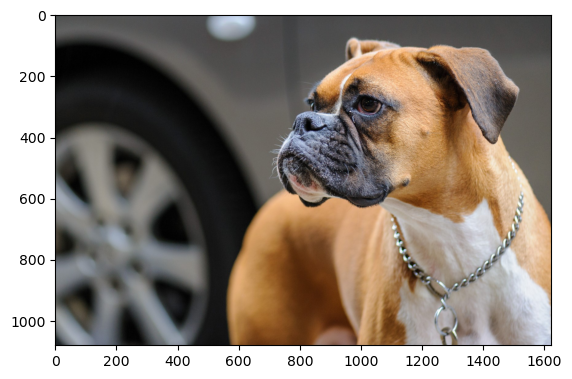

Predicted: American Staffordshire terrier: 62.8%, Actual: Staffordshire bullterrier


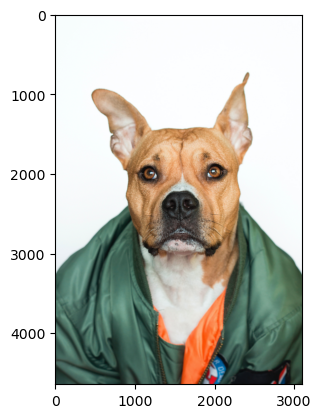

Predicted: nail: 77.4%, Actual: nail


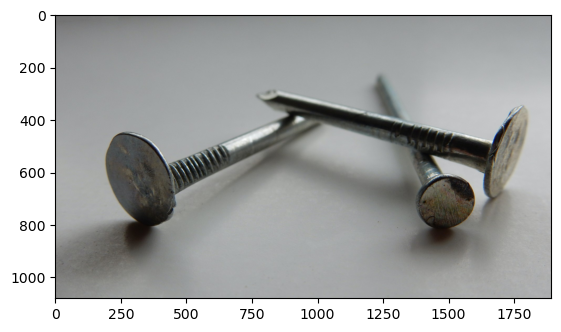

Predicted: tile roof: 80.4%, Actual: tile roof


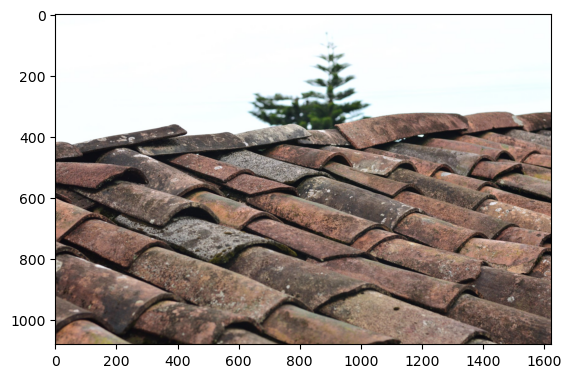

Predicted: forklift: 48.7%, Actual: forklift


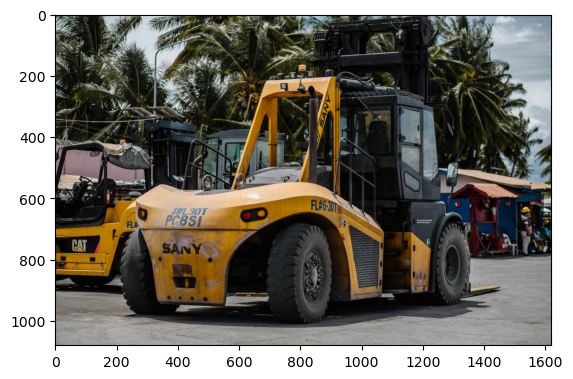

In [13]:
predict_img_samples(model, weights, input_images)

## MobileNet V3

In [14]:
from torchvision.models import mobilenet_v3_large, MobileNet_V3_Large_Weights

# Initialize model with the best available weights
weights = MobileNet_V3_Large_Weights.IMAGENET1K_V1
model = mobilenet_v3_large(weights=weights)
model.name = 'Mobilenet V3 (IMAGENET1K_V1)'

if torch.cuda.is_available():
    model.cuda()

summary(model, input_size = (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 256]             432
       BatchNorm2d-2         [-1, 16, 256, 256]              32
         Hardswish-3         [-1, 16, 256, 256]               0
            Conv2d-4         [-1, 16, 256, 256]             144
       BatchNorm2d-5         [-1, 16, 256, 256]              32
              ReLU-6         [-1, 16, 256, 256]               0
            Conv2d-7         [-1, 16, 256, 256]             256
       BatchNorm2d-8         [-1, 16, 256, 256]              32
  InvertedResidual-9         [-1, 16, 256, 256]               0
           Conv2d-10         [-1, 64, 256, 256]           1,024
      BatchNorm2d-11         [-1, 64, 256, 256]             128
             ReLU-12         [-1, 64, 256, 256]               0
           Conv2d-13         [-1, 64, 128, 128]             576
      BatchNorm2d-14         [-1, 64, 1

---------- Predicting some samples for 'Mobilenet V3 (IMAGENET1K_V1)' ----------

Predicted: tiger: 84.1%, Actual: tiger


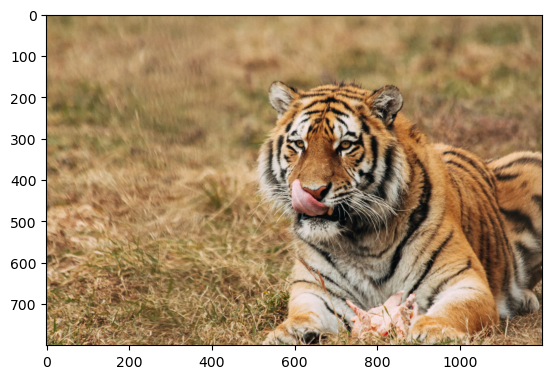

Predicted: Persian cat: 35.5%, Actual: tabby


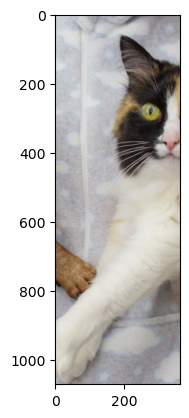

Predicted: boxer: 98.4%, Actual: boxer


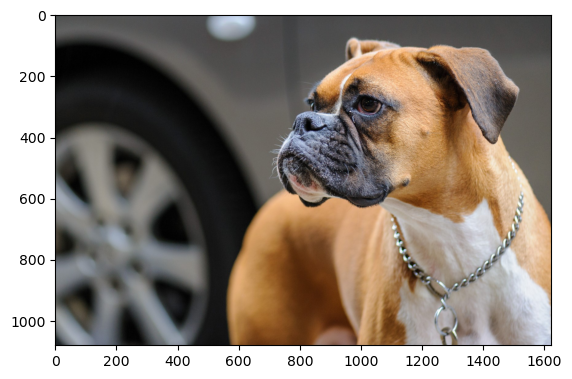

Predicted: American Staffordshire terrier: 48.5%, Actual: Staffordshire bullterrier


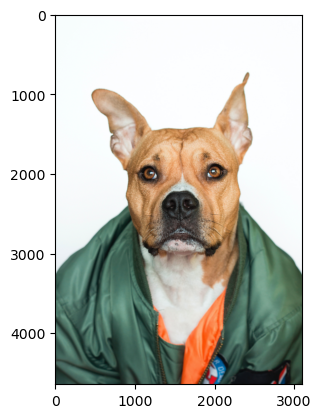

Predicted: nail: 85.7%, Actual: nail


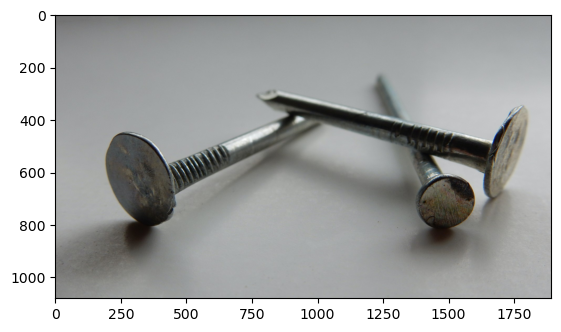

Predicted: tile roof: 100.0%, Actual: tile roof


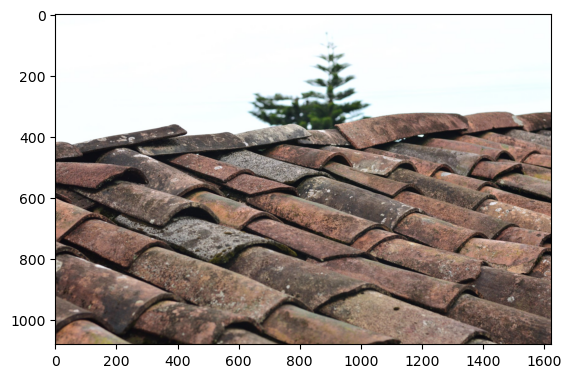

Predicted: forklift: 83.8%, Actual: forklift


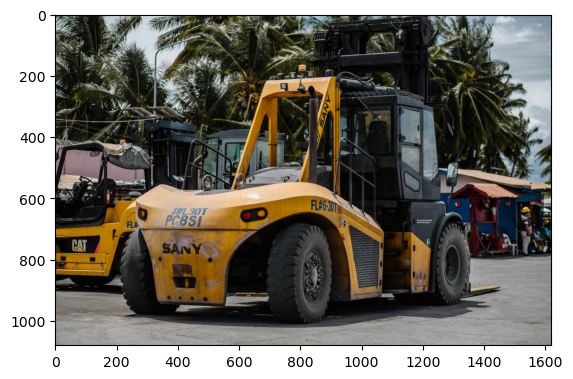

In [15]:
predict_img_samples(model, weights, input_images)

## SqueezeNet

In [16]:
from torchvision.models import squeezenet1_1, SqueezeNet1_1_Weights

# Initialize model with the best available weights
weights = SqueezeNet1_1_Weights.IMAGENET1K_V1
model = squeezenet1_1(weights=weights)
model.name = 'SqueezeNet 1_1 (IMAGENET1K_V1)'

if torch.cuda.is_available():
    model.cuda()

mod_sum = summary(model, input_size = (3, 512, 512))

Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /home/user/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth
100%|██████████| 4.73M/4.73M [00:00<00:00, 10.1MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 255, 255]           1,792
              ReLU-2         [-1, 64, 255, 255]               0
         MaxPool2d-3         [-1, 64, 127, 127]               0
            Conv2d-4         [-1, 16, 127, 127]           1,040
              ReLU-5         [-1, 16, 127, 127]               0
            Conv2d-6         [-1, 64, 127, 127]           1,088
              ReLU-7         [-1, 64, 127, 127]               0
            Conv2d-8         [-1, 64, 127, 127]           9,280
              ReLU-9         [-1, 64, 127, 127]               0
             Fire-10        [-1, 128, 127, 127]               0
           Conv2d-11         [-1, 16, 127, 127]           2,064
             ReLU-12         [-1, 16, 127, 127]               0
           Conv2d-13         [-1, 64, 127, 127]           1,088
             ReLU-14         [-1, 64, 1

---------- Predicting some samples for 'SqueezeNet 1_1 (IMAGENET1K_V1)' ----------

Predicted: tiger: 97.2%, Actual: tiger


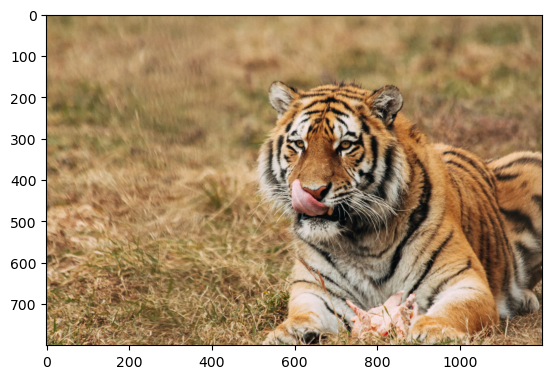

Predicted: Siamese cat: 24.8%, Actual: tabby


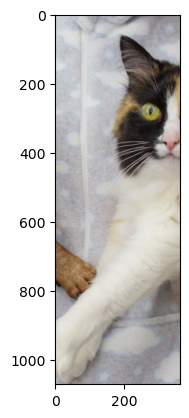

Predicted: boxer: 80.2%, Actual: boxer


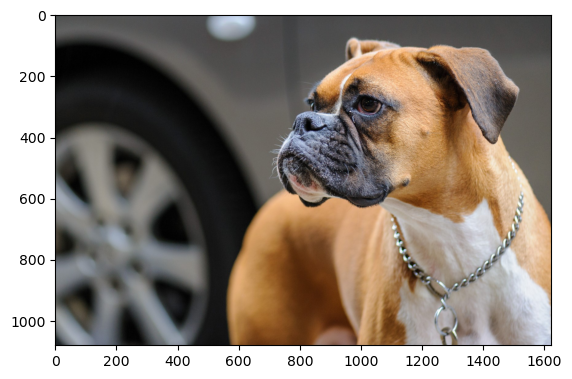

Predicted: American Staffordshire terrier: 54.8%, Actual: Staffordshire bullterrier


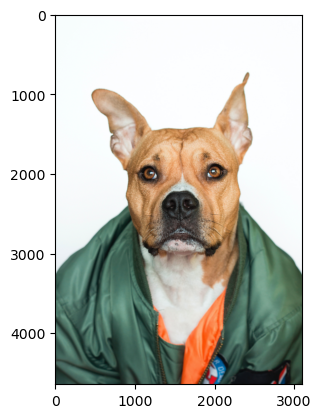

Predicted: nail: 69.2%, Actual: nail


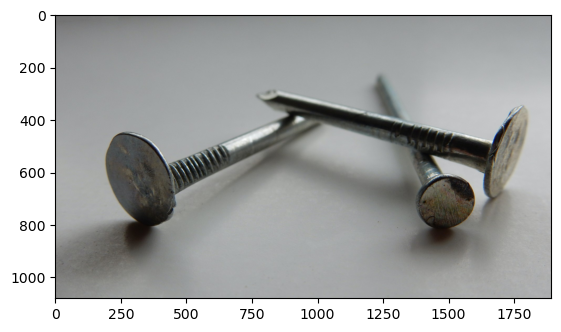

Predicted: tile roof: 76.8%, Actual: tile roof


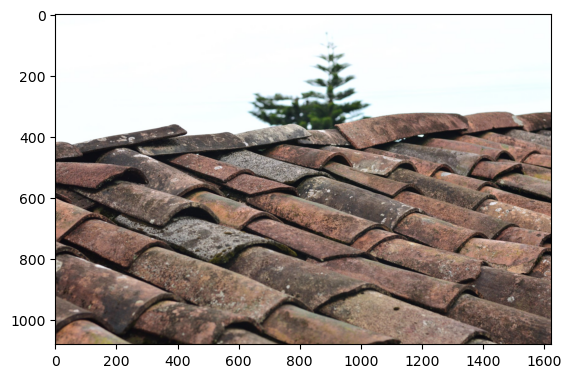

Predicted: school bus: 52.5%, Actual: forklift


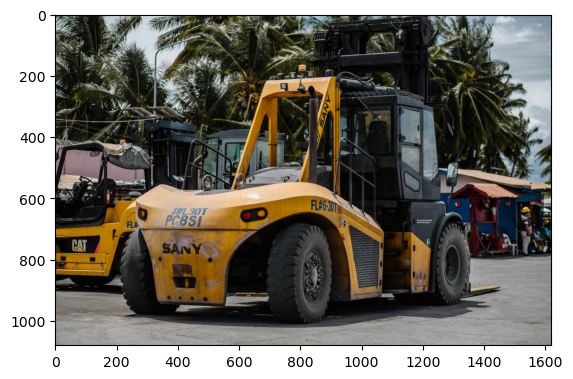

In [17]:
predict_img_samples(model, weights, input_images)